In [1]:
##Importing libraries
import pandas as pd
import requests
import pickle
import re
import string
import unidecode 
import wordninja
import docx2txt
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer 
from autocorrect import Speller 
from nltk.corpus import stopwords 
from nltk import word_tokenize 
import seaborn as sns, numpy as np
import matplotlib.pyplot as plt
import PyPDF2 

from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from alive_progress import alive_bar
pd.set_option("display.max_rows", None, "display.max_columns", None)

from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.linear_model import SGDClassifier
from sklearn.metrics.pairwise import cosine_similarity




In [2]:
##load related data. 
#data_linkedin = pickle.load( open( "linkedin_data.pkl", "rb" ) )
#data_indeed = pickle.load( open( "save.p", "rb" ) )
data = pd.read_csv('dice_com-job_us_sample.csv')

In [ ]:
##This step is to understand how the job description looks and how type of cleaning I could perform. 
for i in range(0, len(data_linkedin)):
    print(data_linkedin['full_text'].iloc[i])

In [98]:
## Decided to not use API to extract data, but use the dataset fiirst. 
data_jobdescription = pd.DataFrame(data['jobdescription'])
data_jobdescription['jobtitle'] = data['jobtitle']

In [92]:
#most used word provides me a better understanding of the dataset and how can I clean the dataset. 
most_used_word = pd.Series(' '.join(data['jobdescription']).lower().split()).value_counts()[:100]

In [60]:
most_used_word

and              397697
to               191727
the              159955
of               157416
in               121667
with             116781
a                106786
for               80622
experience        66028
is                49246
or                49113
as                42186
on                37301
business          34475
be                33022
work              31035
will              30841
our               29781
are               29514
development       27285
data              26143
an                25324
years             24365
technical         24026
you               23929
software          22195
team              22175
*                 22072
this              22042
that              21743
project           21200
we                21059
management        20833
have              20610
support           20088
knowledge         19664
-                 18396
it                18062
at                17644
skills            17330
all               16928
ability         

In [93]:
#less used word in the dataset
pd.Series(' '.join(data['jobdescription']).lower().split()).value_counts()[-100:]
##Glancing the less counted words provide directiion to clean the text: 
# - clean punctuation 
# - clean out email, website, etc. 

d'etre                                1
responsibilities:responds             1
shiseido,                             1
multi-task.maintains                  1
symbolizes                            1
consumer-oriented,                    1
hrs/week.                             1
systems.take                          1
maintenancesolve                      1
8am-8-pm)                             1
skills.dhcp                           1
antivirushp                           1
years).strong                         1
followingmust                         1
732-374-6592                          1
sweepstakes,                          1
facing!                               1
approvals.required                    1
privacy•implement                     1
managerworked                         1
managerclient                         1
skillsjirabasecamp                    1
offer$65kfull                         1
vision401kgenerous                    1
pig•translate                         1


In [62]:
#how many unique words does the dataset have
pd.Series(' '.join(data['jobdescription']).lower().split()).nunique()

288855

In [63]:
##how many words does the dataset have in total
len(pd.Series(' '.join(data['jobdescription']).lower().split()))

6817581

In [99]:
## First round cleaning
def clean_text_round1(text):
    ##make all word lower case, remove link, email address
    text = text.lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub(r'http\S+', '', text)
    text = re.sub(r'[\w\.-]+@[\w\.-]+', " ", text)
    #turning all languages to unidecode 
    text = unidecode.unidecode(text)
    ##remove extra white space
    pattern = re.compile(r'\s+') 
    Without_whitespace = re.sub(pattern, ' ', text)
    ##removing the basic punctuation
    for i in string.punctuation: 
        text = Without_whitespace.replace(i , ' ')
        
    ##removing extra punctuation   
    text = Without_whitespace.replace('?', ' ').replace(')', ' ').replace('(',' ').replace('•', ' • ').replace(":", " ").replace(',',' ').replace('.', ' ').replace('/',' ').replace('!', " ").replace(';', ' ').replace('*', ' ').replace('"', ' ').replace('-',' ').replace('”', " ").replace('>', ' ').replace('-',' ').replace("'s", ' ')
    return text

round1 = lambda x: clean_text_round1(x)

In [100]:
# Let's take a look at the updated text
data_clean = pd.DataFrame(data.jobdescription.apply(round1))


In [66]:
##checking the cleaning progress
data_clean.jobdescription.iloc[0]

"looking for selenium engineers   must have solid java coding skills i have several openings some 3 month to hire some 6   must be able to go perm this can be someone with 0 5 years of experience  most important qualities are eagerness and aptitude  position purpose   do you want to be on the forefront of cutting edge technology  introduce solutions to problems that didn't exist before  and have the ability to see the result of your successes  our client assures growth by collaborating with development teams and creating tools that aid engineers in building  testing  debugging  and releasing software  we touch millions of users by increasing the rate of development and ensuring our products are methodically tested  we are experts in software health  testability  and sustainability  as a software engineer in test at our client  you can expect to build flexible and scalable solutions while working on some of the most complex challenges in large scale computing by utilizing your skills in

In [67]:
##Create a dataframe to see each word counts in the whole dataset 
less_used_word_clean1 = pd.DataFrame(' '.join(data_clean['jobdescription']).split()).value_counts()

In [ ]:
less_used_word_clean1 

In [68]:
##how many words does the dataset have in total after first round cleaning
len(pd.Series(' '.join(data_clean['jobdescription']).split()))

7050414

In [69]:
##how many unique words does the dataset have after first round cleaning
pd.Series(' '.join(data_clean['jobdescription']).split()).nunique()

117360

Second round of cleaning: 
As you can see above, many words are joined together, I use the library wordninja to slipt the words. However, because of the technical terms in the job description, such as "C++", "JSON", this type of words have been split as well. That's why I first see if the word has appear more than 4 times in the dataset, I won't split the word. 

In [101]:
def clean_text_round2(data_column):
    word_count = pd.DataFrame(' '.join(data_column).split()).value_counts()
    list2=[]
    list3 = data_column.values.tolist()
    with alive_bar(force_tty = True) as bar: 
        for a in range(0, len(data_column)): 
            list1 = []
            for b in range(0, len(list3[a].split())):
                if word_count[list3[a].split()[b]] > 4:
                    list1.append(list3[a].split()[b])
                else:
                    text = wordninja.split(list3[a].split()[b])
                    for i in range(0, len(text)):
                        list1.append(text[i])
            list2.append(list1)
        bar()
    for i in range(0, len(data_column)):
        text=' '.join(list2[i])
        data_column.iloc[i] = text
#downside: this code takes too much time to run. 

In [102]:
##Apply round 2 cleaning
clean_text_round2(data_clean['jobdescription'])

|████████████████████████████████████████| (!) 1 in 17:42.0 (0.00/s) :44 (0.0/s) (0.0/s) 


In [72]:
data_clean['jobdescription']

0        looking for selenium engineers must have solid...
1        the university of chicago has a rapidly growin...
2        galaxe solutionsevery day our solutions affect...
3        java developerfull time direct hire bo ling br...
4        midtown based high tech firm has an immediate ...
5        we are looking for a senior sap fico architect...
6        network engineer job description a network eng...
7        bluebeam is looking for talented sr web develo...
8        this is a fulltime position for a javascript d...
9        summaryour client is the leading provider of o...
10       job description as a senior member of the team...
11       must have skills unix iam identity access mana...
12       vanderhouwen has more jobs you may like find t...
13       genesis10 is currently seeking a sales enginee...
14       vanderhouwen has more jobs you may like find t...
15       windows systems administrator the windows syst...
16       location atlanta gajob title test lead manager.

In [103]:
##check how the less used words look like after 2 rounds cleaning
pd.Series(' '.join(data_clean['jobdescription']).split()).value_counts()[-100:]

493563            1
495145            1
2522              1
494026            1
494898            1
populates         1
492948            1
intractable       1
493313            1
tabling           1
9735              1
492982            1
494456            1
solids            1
bodyside          1
sunshine          1
00953             1
transcriptions    1
suspensions       1
494062            1
goli              1
496653            1
495142            1
494913            1
494931            1
496766            1
delegations       1
cliff             1
488982            1
494448            1
roa               1
492448            1
492807            1
channeled         1
487440            1
492432            1
487734            1
496396            1
494974            1
stratifying       1
495522            1
condense          1
494251            1
2550              1
493017            1
488925            1
derivations       1
123383            1
495540            1
140903            1


In [104]:
##check how many unique words the dataset has now after 2 round cleaning.
pd.Series(' '.join(data_clean['jobdescription']).split()).nunique()

38459

In [105]:
#replace one digital number, you can consider this step as one step before the cleaning out all the digits. 
def clean_text_round3(text):
    ##replace one digial number which could indicate year of experience into words. 
    text = re.sub(" 1 ", " one ", text)
    text = re.sub(" 2 ", " two ", text)
    text = re.sub(" 3 ", " three ", text)
    text = re.sub(" 4 ", " four ", text)
    text = re.sub(" 5 ", " five ", text)
    text = re.sub(" 6 ", " six ", text)
    text = re.sub(" 7 ", " seven ", text)
    text = re.sub(" 8 ", " eight ", text)
    text = re.sub(" 9 ", " nine ", text)
    text = re.sub(" 10 ", " ten ", text)
    text = re.sub(" 1+ ", " one ", text)
    text = re.sub(" 2+ ", " two ", text)
    text = re.sub(" 3+ ", " three ", text)
    text = re.sub(" 4+ ", " four ", text)
    text = re.sub(" 5+ ", " five ", text)
    text = re.sub(" 6+ ", " six ", text)
    text = re.sub(" 7+ ", " seven ", text)
    text = re.sub(" 8+ ", " eight ", text)
    text = re.sub(" 9+ ", " nine ", text)
    text = re.sub(" 10+ ", " ten ", text)
    return text

round3 = lambda x: clean_text_round3(x)


In [106]:
with alive_bar(force_tty = True) as bar: 
    data_clean3 = pd.DataFrame(data_clean.jobdescription.apply(round3))
    bar()
data_clean3

|████████████████████████████████████████| (!) 1 in 2.9s (0.34/s) 


,jobdescription
0,looking for selenium engineers must have solid...
1,the university of chicago has a rapidly growin...
2,galaxe solutionsevery day our solutions affect...
3,java developerfull time direct hire bo ling br...
4,midtown based high tech firm has an immediate ...
5,we are looking for a senior sap fico architect...
6,network engineer job description a network eng...
7,bluebeam is looking for talented sr web develo...
8,this is a fulltime position for a javascript d...
9,summaryour client is the leading provider of o...


In [107]:
###check how the less used words look like after 3 rounds cleaning
pd.Series(' '.join(data_clean3['jobdescription']).split()).value_counts()[-500:]

tissue             1
amounting          1
06701              1
dressing           1
116905             1
vintage            1
rfbs               1
9077               1
499                1
rubric             1
distiller          1
6260               1
5363               1
respondents        1
culinary           1
07012              1
0229               1
promulgate         1
4479               1
densification      1
minim              1
dunlop             1
eking              1
exon               1
gasses             1
gratification      1
8174               1
00017370           1
04105              1
aqua               1
bristle            1
lewin              1
vhs                1
otter              1
8384               1
9339               1
daydream           1
1214               1
textile            1
8451               1
citadel            1
sorter             1
oecd               1
icu                1
trojan             1
propagated         1
6933               1
8009         

In [108]:
##check how many unique words the dataset has now after 3 round cleaning.
pd.Series(' '.join(data_clean3['jobdescription']).split()).nunique()

38439

In [109]:
#@cleaning all digits in the dateset, aiming for telephone number or zip code or job ID etc. 
def clean_text_round4(text):
    ##removing all digital 
    text = re.sub('\d', '', text)
    return text

round4 = lambda x: clean_text_round4(x)

In [110]:
with alive_bar(force_tty = True) as bar: 
    data_clean4 = pd.DataFrame(data_clean3.jobdescription.apply(round4))
    bar()
data_clean4

|████████████████████████████████████████| (!) 1 in 0.6s (1.63/s) ▆ 0 in 0s (0.0/s) 


,jobdescription
0,looking for selenium engineers must have solid...
1,the university of chicago has a rapidly growin...
2,galaxe solutionsevery day our solutions affect...
3,java developerfull time direct hire bo ling br...
4,midtown based high tech firm has an immediate ...
5,we are looking for a senior sap fico architect...
6,network engineer job description a network eng...
7,bluebeam is looking for talented sr web develo...
8,this is a fulltime position for a javascript d...
9,summaryour client is the leading provider of o...


In [111]:
##check how many unique words the dataset has now after 4 round cleaning.
pd.Series(' '.join(data_clean4['jobdescription']).split()).nunique()

32451

In [112]:
###check how word counts look like after 4 rounds cleaning
pd.Series(' '.join(data_clean4['jobdescription']).split()).value_counts()

and                                                                                 406822
to                                                                                  197660
the                                                                                 164555
of                                                                                  158874
in                                                                                  126199
with                                                                                117677
a                                                                                   111614
experience                                                                           89609
for                                                                                  82120
or                                                                                   58264
is                                                                                   50515

In [113]:
##pickle this for EDA. 
data_clean4.to_pickle("clean_data.pkl")

## Dealing with the Resume side!

In [10]:
resume = ''.join(docx2txt.process("Sample_CV.docx"))

In [160]:
d = {'resume': [resume]}
df_resume = pd.DataFrame(data = d)

In [165]:
df_resume = pd.DataFrame(df_resume['resume'].apply(round1))
clean_text_round2(df_resume['resume'])
df_resume = pd.DataFrame(df_resume['resume'].apply(round3))
df_resume = pd.DataFrame(df_resume['resume'].apply(round4))
df_resume


|████████████████████████████████████████| (!) 1 in 0.2s (6.44/s) 


,resume
0,maria lisa email phone five five career summar...


In [174]:
##pickle the clean resume for later use. 
df_resume.to_pickle("df_resume.pkl")

In [3]:
data_clean = pd.DataFrame()
df_resume = pd.DataFrame()
data_clean = pd.read_pickle('clean_data.pkl')
df_resume = pd.read_pickle('df_resume.pkl')

In [4]:
resume_clean = df_resume['resume'].iloc[0]

In [172]:
type(resume_clean )

str

In [11]:
similarity_scores_clean = []
similarity_scores = []
from sklearn.feature_extraction.text import CountVectorizer

cv = CountVectorizer(stop_words='english')
for i in range(0,len(data)):
    job_description_dirty = data.iloc[i]['jobdescription']
    job_description = data_clean.iloc[i]['jobdescription']
    text = [resume, job_description_dirty]
    text_clean = [resume_clean, job_description]
    count_matrix = cv.fit_transform(text)
    count_matrix_clean = cv.fit_transform(text_clean)
    similarity_scores.append(cosine_similarity(count_matrix)[0][1])
    similarity_scores_clean.append(cosine_similarity(count_matrix_clean)[0][1])

In [12]:
job_score = pd.DataFrame(similarity_scores_clean, columns = ['similarity_scores_clean'])
job_score['similarity_scores_dirty']=similarity_scores

In [13]:
job_score['jobdescription'] = data['jobdescription']
job_score['jobdescription_clean'] = data_clean['jobdescription']

In [14]:
job_score.head()

,similarity_scores_clean,similarity_scores_dirty,jobdescription,jobdescription_clean
0,0.258588,0.258594,Looking for Selenium engineers...must have sol...,looking for selenium engineers must have solid...
1,0.102804,0.103388,The University of Chicago has a rapidly growin...,the university of chicago has a rapidly growin...
2,0.181085,0.183019,"GalaxE.SolutionsEvery day, our solutions affec...",galaxe solutionsevery day our solutions affect...
3,0.197302,0.192142,Java DeveloperFull-time/direct-hireBolingbrook...,java developerfull time direct hire bo ling br...
4,0.135135,0.131640,Midtown based high tech firm has an immediate ...,midtown based high tech firm has an immediate ...


/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='similarity_scores_clean', ylabel='Density'>

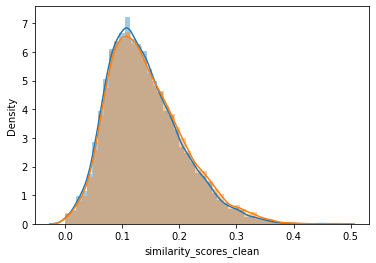

In [19]:
#after cleaning 4 rounds
sns.distplot(job_score['similarity_scores_dirty'])
sns.distplot(job_score['similarity_scores_clean'])

/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='similarity_scores_dirty', ylabel='Density'>

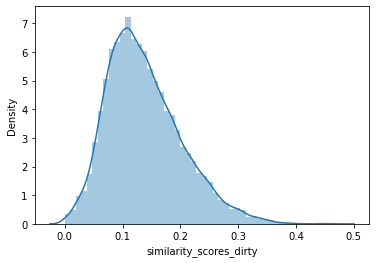

In [18]:
sns.distplot(job_score['similarity_scores_dirty'])

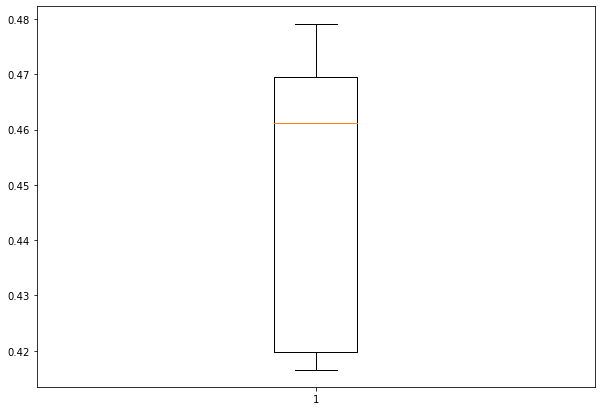

In [189]:
fig = plt.figure(figsize =(10, 7))
plt.boxplot(top_10_jobs['job_scores'])
plt.show()